<a href="https://colab.research.google.com/github/mad0101/Capstone_Project_MT22110/blob/main/yolov5m.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import torch

In [3]:
from IPython.display import Image

In [4]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [5]:
%cd yolov5

/content/yolov5


In [6]:
from tqdm import tqdm
!pip install IProgress
from ipywidgets import IntProgress

In [8]:
torch.cuda.get_arch_list()

['sm_50', 'sm_60', 'sm_70', 'sm_75', 'sm_80', 'sm_86', 'sm_37', 'sm_90']

In [9]:
print('All set. Using PyTorch version %s with %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

All set. Using PyTorch version 2.1.0+cu118 with _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


In [10]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="HVuIFw2sixheKD61ArDb")
project = rf.workspace("indraprastha-institute-of-information-technology").project("mpl-0dnbp")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to MPL-1 in yolov5pytorch:: 100%|██████████| 3678/3678 [00:00<00:00, 5009.23it/s]


In [11]:
pip install -r requirements.txt

In [15]:
!python train.py --img 640 --batch 16 --epochs 50 --data /content/yolov5/MPL-1/data.yaml --weights yolov5m.pt --cache

2023-11-18 08:28:39.898094: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-18 08:28:39.898149: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-18 08:28:39.898191: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5m.pt, cfg=, data=/content/yolov5/MPL-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, 

In [16]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

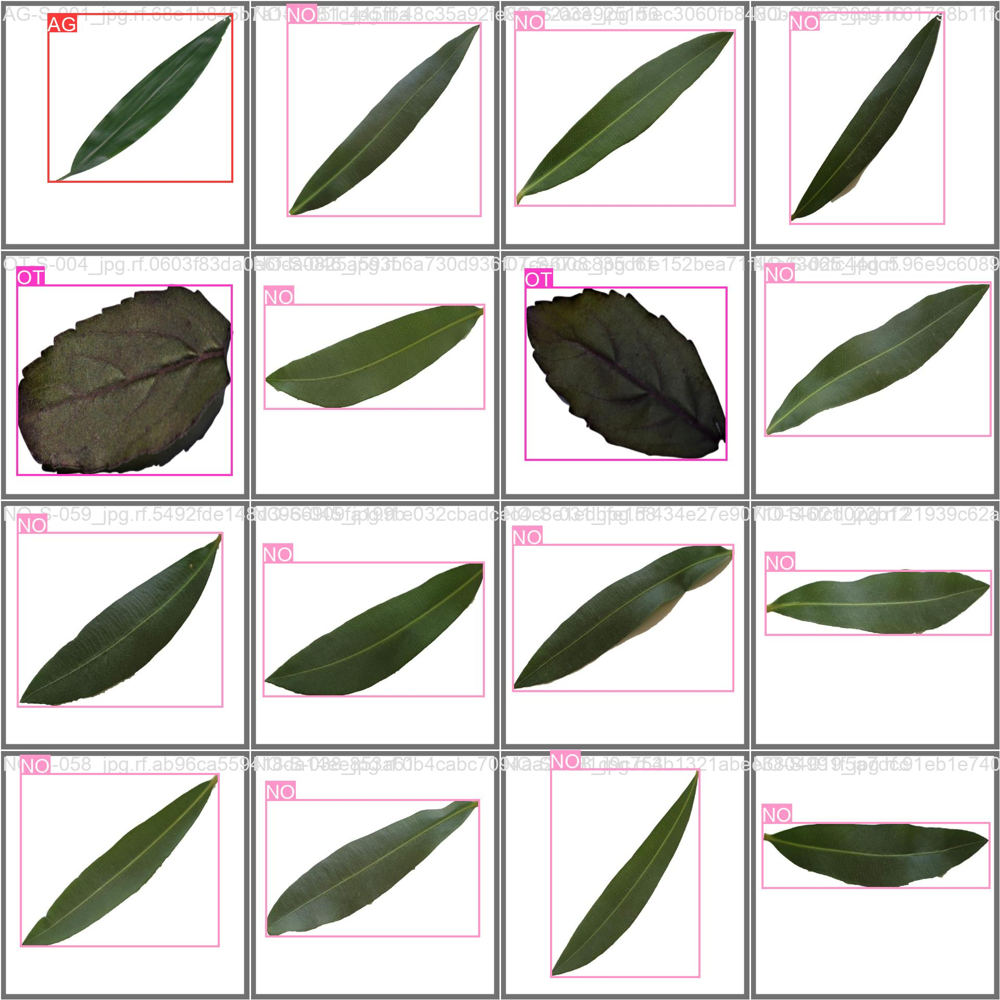

In [18]:
Image(filename='/content/yolov5/runs/train/exp2/val_batch0_labels.jpg', width=1000)

In [ ]:
!python export.py --weights runs/train/exp/weights/best.pt --include tflite --img 640

export: data=data/coco128.yaml, weights=['runs/train/exp/weights/best.pt'], imgsz=[640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tflite']
YOLOv5 🚀 v7.0-211-g94e943e Python-3.10.12 torch-2.0.1+cu118 CPU

Fusing layers... 
Model summary: 157 layers, 7088338 parameters, 0 gradients, 16.0 GFLOPs

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 25200, 34) (13.9 MB)

TensorFlow SavedModel: starting export with tensorflow 2.12.0...

                 from  n    params  module                                  arguments                     
2023-08-25 04:41:35.055221: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
  0                -1  1     